# Active Lichess users - Exploratory Data Analysis

## Data overview

In [1]:
#General libraries
import os
import sys
import ast
from itertools import combinations
from datetime import datetime

#Data handling libraries
import pandas as pd
import numpy as np

#Data visualization libraries
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib import dates as mdates
from matplotlib.dates import DateFormatter
from matplotlib.ticker import MultipleLocator, FuncFormatter, LogLocator
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib.patches as mplp

#Jupyter display libraries
import ipywidgets as widgets
from IPython.display import display

#Helper functions
def roundup_100(x):
    return x if x % 100 == 0 else x + 100 - x % 100

#Meta-data
curr_path = os.getcwd()
#Get temporary folder for storing processing data
temp_data_folder = curr_path + '\\temp_store'
active_users_data_path = 'very_active_users_all_batches.csv'

In the previous data preprocessing steps, the data of all of the played games during January 2022 (102,110,423 games in total) was transformed into the usernames of the players and the number of games per player (1,789,543 users in total). 

Taking the meta-data for all users using the Lichess API would have been unnecessarily time-consuming, so a subset was selected with active players (> 30 games played).
This left us with 868,856 users, which still took a week to collect (the API was the bottleneck, it had a limit to how many calls could be made per second to protect it from malicious attacks).

The meta-data per user is given by https://lichess.org/api#operation/apiUser, from which only the relevant features were selected.
After the data was processed, disabled account (24,854 in total) and bot accounts and accounts with a ToS violation (14,636 in total) were removed, and we have ended up with 829,366 active users in total.

In [2]:
active_users_df = pd.read_csv(temp_data_folder+'\\'+active_users_data_path,
                              index_col = (0),
                              dtype={"('bullet', 'gameCount')":'int32', 
                                     "('bullet', 'rating')":'int16',
                                     "('bullet', 'ratingDeviation')":'int16',
                                     "('blitz', 'gameCount')":'int32',
                                     "('blitz', 'rating')":'int16',
                                     "('blitz', 'ratingDeviation')":'int16',
                                     "('rapid', 'gameCount')":'int32',
                                     "('rapid', 'rating')":'int16',
                                     "('rapid', 'ratingDeviation')":'int16', 
                                     'gamesCompletionRate':'int8',
                                     'title':'category'},
                            parse_dates = ['accountCreationTime','accountLastActiveTime'])
#Rename tuple column names to be actual tuples
active_users_df.rename(columns = {"('bullet', 'gameCount')":ast.literal_eval("('bullet', 'gameCount')"), 
                                     "('bullet', 'rating')":ast.literal_eval("('bullet', 'rating')"),
                                     "('bullet', 'ratingDeviation')":ast.literal_eval("('bullet', 'ratingDeviation')"),
                                     "('blitz', 'gameCount')":ast.literal_eval("('blitz', 'gameCount')"),
                                     "('blitz', 'rating')":ast.literal_eval("('blitz', 'rating')"),
                                     "('blitz', 'ratingDeviation')":ast.literal_eval("('blitz', 'ratingDeviation')"),
                                     "('rapid', 'gameCount')":ast.literal_eval("('rapid', 'gameCount')"),
                                     "('rapid', 'rating')":ast.literal_eval("('rapid', 'rating')"),
                                     "('rapid', 'ratingDeviation')":ast.literal_eval("('rapid', 'ratingDeviation')")},
                       inplace = True)

active_users_df = active_users_df.reset_index()
#drop redundant index column
active_users_df = active_users_df.drop(columns = ['index'],axis = 1)
#drop redundant tosViolation columns (tosViolation = True rows were removed before)
active_users_df = active_users_df.drop(columns = ['tosViolation'],axis = 1)
active_users_df.head(5)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
0,-adam-,2014-07-08 18:14:36.992,2022-03-13 22:23:36.172,1,1335,275,3122,1747,45,4100,1990,50,97,NaN,False
1,0203,2014-01-06 21:31:55.978,2022-03-14 18:14:55.836,0,1500,500,23093,1459,45,2342,1448,163,97,NaN,False
2,071jn,2012-03-04 13:36:54.000,2022-03-14 16:53:32.690,2,1021,299,129,1759,99,2217,1879,45,100,NaN,False
3,1001Moves,2014-06-04 18:01:11.843,2022-03-14 20:18:20.094,35,1190,193,13661,1922,45,687,1655,246,77,NaN,False
4,10H01,2014-05-18 06:47:54.287,2022-03-13 19:53:31.363,6054,1573,66,6794,1861,49,3763,2107,70,93,NaN,False


In [3]:
f'Number of active users: {active_users_df.shape[0]:,.0f}'

'Number of active users: 829,366'

### Features

For each of the users we extracted 15 features:
- username (string) - the usernames of the account
- accountCreationTime (datetime) - the datetime of the creation of the account
- accountLastActiveTime (datetime) - the datetime of the last activity of the account
- (bullet/blitz/rapid , gameCount) (integer) - the number of games played by the account for the given time control (bullet/blitz/rapid)
- (bullet/blitz/rapid , rating) (integer) - the latest elo rating of the account for the given time control (bullet/blitz/rapid)
- (bullet/blitz/rapid , ratingDeviation) (integer) - the latest rating deviation (measurement of the accuracy of the elo rating, initialy set to 500, but lowers with more games played, down to a minimum of 45, a provisional rating is considered > 110 rd, a ranked rating is considered < 75 rd, is increased with inactivity) of the account for the given time control (bullet/blitz/rapid) 
- gamesCompletionRate (integer) - percentage of games completed by standard means (< 100 means at least one game was abandoned - considered bad sportsmanship)
- title (category) - the highest master title of the user [None, 'FM', 'WIM', 'GM', 'IM', 'CM', 'NM', 'LM', 'WFM', 'WCM', 'WGM', 'WNM']
- verified (boolean) - a special badge given to high profile members or big tournament organizers, very rare

In [4]:
'Number of features: ' + str(active_users_df.shape[1])

'Number of features: 15'

In [5]:
df_features = pd.concat([active_users_df.dtypes,active_users_df.memory_usage(deep = True)],axis=1)
df_features = df_features.rename(columns={0: "dtype", 1: "memory_usage"})
df_features

,dtype,memory_usage
username,object,55748338
accountCreationTime,datetime64[ns],6634928
accountLastActiveTime,datetime64[ns],6634928
"(bullet, gameCount)",int32,3317464
"(bullet, rating)",int16,1658732
"(bullet, ratingDeviation)",int16,1658732
"(blitz, gameCount)",int32,3317464
"(blitz, rating)",int16,1658732
"(blitz, ratingDeviation)",int16,1658732
"(rapid, gameCount)",int32,3317464


## Modified data analysis

*All of these modification are subject to change

### Remove verified accounts and users with game completion rate < 100

In [6]:
#Remove verified accounts
mask = active_users_df['verified'] == False
active_users_df_mod = active_users_df[mask]
active_users_df_mod = active_users_df_mod.drop(columns=['verified'])
#Keep only users with gamesCompletionRate == 100
mask = active_users_df_mod['gamesCompletionRate'] == 100
#users with gamesCompletionRate < 100 for comparison
active_users_df_mod_anti = active_users_df_mod[~mask]
active_users_df_mod_anti = active_users_df_mod_anti.drop(columns=['gamesCompletionRate'])
#Get the desired dataset
active_users_df_mod = active_users_df_mod[mask]
active_users_df_mod = active_users_df_mod.drop(columns=['gamesCompletionRate'])

print(f'Number of selected users: {active_users_df_mod.shape[0]:,.0f}')
display(active_users_df_mod.head(10))
print(f'Number of unselected users: {active_users_df_mod_anti.shape[0]:,.0f}')
display(active_users_df_mod_anti.head(10))

Number of selected users: 135,665


,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",title
2,071jn,2012-03-04 13:36:54.000,2022-03-14 16:53:32.690,2,1021,299,129,1759,99,2217,1879,45,NaN
8,1365,2013-03-09 13:49:41.841,2022-01-31 10:57:51.535,7164,1683,116,9406,1764,92,1372,1618,174,NaN
12,1Cavalodetroia,2011-11-20 14:44:18.000,2022-03-14 20:42:06.939,3026,1579,45,2885,1935,45,153,1882,86,NaN
16,21NameMy,2012-08-18 23:09:50.549,2022-03-14 21:52:56.243,4,1125,234,3167,1423,45,1809,1618,119,NaN
22,2Ap,2014-02-01 21:10:39.947,2022-03-14 22:09:21.804,2930,2229,87,8238,2395,57,467,2163,191,NaN
23,2ndThought,2014-04-05 17:49:41.801,2022-03-14 03:20:32.746,8223,1707,45,731,1823,80,1,1677,428,NaN
24,3OPEHbKA,2014-04-09 22:15:53.053,2022-03-14 00:14:07.318,0,1500,500,4,1266,235,1619,1610,56,NaN
25,3xaxa,2011-04-01 06:37:50.000,2022-03-13 04:19:16.977,0,1500,500,1028,1470,45,3121,1754,177,NaN
33,917,2011-01-27 21:27:23.000,2022-03-11 11:34:54.226,0,1500,500,2,1626,300,484,1460,82,NaN
37,9Jarek9,2014-04-12 11:13:39.105,2022-01-06 18:01:49.646,1932,1756,102,2745,1726,93,1949,1826,102,NaN


Number of unselected users: 693,690


,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",title
0,-adam-,2014-07-08 18:14:36.992,2022-03-13 22:23:36.172,1,1335,275,3122,1747,45,4100,1990,50,NaN
1,0203,2014-01-06 21:31:55.978,2022-03-14 18:14:55.836,0,1500,500,23093,1459,45,2342,1448,163,NaN
3,1001Moves,2014-06-04 18:01:11.843,2022-03-14 20:18:20.094,35,1190,193,13661,1922,45,687,1655,246,NaN
4,10H01,2014-05-18 06:47:54.287,2022-03-13 19:53:31.363,6054,1573,66,6794,1861,49,3763,2107,70,NaN
5,1169,2014-04-15 20:08:20.563,2022-03-13 15:59:31.049,40,966,175,177,1188,164,10559,1735,45,NaN
6,11sushikid,2013-06-08 08:28:33.472,2022-03-14 03:16:41.365,274,1665,55,25,1529,89,43,1723,120,NaN
7,123654789,2014-02-26 15:53:50.463,2022-03-06 14:13:00.286,9,830,129,6,1102,171,300,1051,53,NaN
9,1705012330402,2013-06-10 14:30:59.916,2022-03-13 12:41:04.154,226,1350,211,38835,1884,50,4573,1970,157,NaN
10,18844079512,2013-08-10 12:07:38.313,2022-03-14 03:29:59.961,400,1098,45,2780,1531,46,5140,1796,66,NaN
11,19dano,2013-04-05 12:58:52.694,2022-02-26 11:09:34.154,358,1474,172,669,1932,60,32,1489,226,NaN


### Very active users by total number of games (all time controls)

In [7]:
#active_users_df_mod['gamesCompletionRate'] == 100
print(f'Selected users descriptive statistics:')
game_count_total = active_users_df_mod[('bullet', 'gameCount')] + active_users_df_mod[('blitz', 'gameCount')] + active_users_df_mod[('rapid', 'gameCount')]
game_count_total_stats = pd.DataFrame(game_count_total.describe())
game_count_total_stats.columns = ['all_games_count']
display(game_count_total_stats.T)
mask = game_count_total > 5000
game_count_total_5k = active_users_df_mod[mask]
print(f'\t> 5000 games played (total)')
display(game_count_total_5k.describe())
#active_users_df_mod['gamesCompletionRate'] < 100
print(f'Unselected users descriptive statistics:')
game_count_total_not_selected = active_users_df_mod_anti[('bullet', 'gameCount')] + active_users_df_mod_anti[('blitz', 'gameCount')] + active_users_df_mod_anti[('rapid', 'gameCount')]
game_count_total_stats_not_selected = pd.DataFrame(game_count_total_not_selected.describe())
game_count_total_stats_not_selected.columns = ['all_games_count']
display(game_count_total_stats_not_selected.T)
mask = game_count_total_not_selected > 5000
game_count_total_5k_not_selected = active_users_df_mod_anti[mask]
print(f'\t> 5000 games played (total)')
display(game_count_total_5k_not_selected.describe())

Selected users descriptive statistics:


,count,mean,std,min,25%,50%,75%,max
all_games_count,135665.0,2860.350363,5994.706447,0.0,135.0,854.0,2983.0,168261.0


	> 5000 games played (total)


,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)"
count,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000
mean,6326.158954,1713.213794,100.174489,5314.341912,1866.215526,64.596650,781.593982,1817.089841,163.617893
std,9890.897875,360.737818,115.486791,5555.829763,317.327892,46.280363,1986.833084,310.779602,137.725142
min,0.000000,600.000000,45.000000,0.000000,641.000000,45.000000,0.000000,745.000000,45.000000
25%,400.000000,1480.000000,45.000000,1595.500000,1650.000000,45.000000,11.000000,1539.000000,73.000000
50%,3606.000000,1694.000000,48.000000,4050.000000,1872.000000,47.000000,114.000000,1822.000000,113.000000
75%,7804.500000,1965.000000,88.000000,6995.000000,2087.000000,66.000000,593.000000,2049.000000,182.000000
max,168220.000000,3252.000000,500.000000,100730.000000,3214.000000,500.000000,42655.000000,2861.000000,500.000000


Unselected users descriptive statistics:


,count,mean,std,min,25%,50%,75%,max
all_games_count,693690.0,1917.738585,4302.28588,0.0,65.0,456.0,1875.0,158034.0


	> 5000 games played (total)


,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)"
count,70990.000000,70990.000000,70990.000000,70990.000000,70990.000000,70990.000000,70990.000000,70990.000000,70990.000000
mean,4620.035104,1633.975588,111.706832,5613.523215,1811.353360,63.926933,1001.999634,1779.613551,156.765305
std,7687.680485,363.364844,117.591138,5560.660858,319.552699,46.561163,2357.687463,310.385092,131.575760
min,0.000000,600.000000,45.000000,0.000000,600.000000,45.000000,0.000000,600.000000,45.000000
25%,80.000000,1382.000000,45.000000,1855.250000,1595.000000,45.000000,12.000000,1503.000000,70.000000
50%,2015.000000,1602.000000,58.000000,4593.000000,1818.000000,46.000000,129.000000,1783.000000,111.000000
75%,6002.000000,1880.000000,118.000000,7388.000000,2030.000000,64.000000,778.000000,2010.000000,175.000000
max,157478.000000,3243.000000,500.000000,108187.000000,3020.000000,500.000000,79908.000000,2894.000000,500.000000


Although there are very active players that have played a lot of games (>5.000) that have a games completion rate < 100, they are unselected from the final dataset under the assumption that since they haven't completed all of their games, and so in the preprocessing of their games there will be a significant number of them that will have to be removed and this may lead to an insufficiently large games dataset for that player.

From this point forward, we will not use these users (*subject to change)

#### Separate by time control (highest number of games per time control)

In [8]:
#Get max number of games of all time controls per player
max_games = game_count_total_5k[[('bullet', 'gameCount'), ('blitz', 'gameCount'), ('rapid', 'gameCount')]].max(axis=1)
#If max is equal for 2 or more time controls, give preference to longer tc
#Is max number of games given time control
mask = game_count_total_5k[('rapid', 'gameCount')] == max_games
active_users_df_mod_rapid = game_count_total_5k[mask]
#Remove selected go get remaning
active_users_df_mod_remaining = game_count_total_5k[~mask]
max_games_remaining = max_games[~mask]
#Is max number of games given time control
mask = active_users_df_mod_remaining[('blitz', 'gameCount')] == max_games_remaining
active_users_df_mod_blitz = active_users_df_mod_remaining[mask]
#Remove selected go get remaning
active_users_df_mod_remaining = active_users_df_mod_remaining[~mask]
max_games_remaining = max_games_remaining[~mask]
#Is max number of games given time control
mask = active_users_df_mod_remaining[('bullet', 'gameCount')] == max_games_remaining
active_users_df_mod_bullet = active_users_df_mod_remaining[mask]
#Check if total of separated is equal of total
total_sep = active_users_df_mod_bullet.shape[0]+active_users_df_mod_blitz.shape[0]+active_users_df_mod_rapid.shape[0]
total_base = game_count_total_5k.shape[0]

print(f'Number of max bullet users: {active_users_df_mod_bullet.shape[0]:,.0f}')
print(f'Number of max blitz users: {active_users_df_mod_blitz.shape[0]:,.0f}')
print(f'Number of max rapid users: {active_users_df_mod_rapid.shape[0]:,.0f}')
print(f'Total: {total_base:,.0f}\tTotal (sum): {total_sep:,.0f}\tEqual: {total_base == total_sep}')

Number of max bullet users: 10,195
Number of max blitz users: 10,110
Number of max rapid users: 1,066
Total: 21,371	Total (sum): 21,371	Equal: True


### Descriptive statistics for all features per time control with maximum number of games played

In [9]:
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

tab.set_title(0,'bullet')
with sub_tab[0]:
    display(active_users_df_mod_bullet.describe(datetime_is_numeric=True).T)
tab.set_title(1,'blitz')
with sub_tab[1]:
    display(active_users_df_mod_blitz.describe(datetime_is_numeric=True).T)
tab.set_title(2,'rapid')
with sub_tab[2]:
    display(active_users_df_mod_rapid.describe(datetime_is_numeric=True).T)

tab.children = sub_tab
display(tab)

#### Titled players (bullet)

In [10]:
#Group players by title
titled_users_df = active_users_df_mod_bullet.groupby(['title'])
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(titled_users_df.ngroups)]

#Get titled player stats
titled_users_stats = titled_users_df.describe(datetime_is_numeric=True)
#Sort by title count
titled_users_stats = titled_users_stats.sort_values(by=[('accountCreationTime','count')],ascending = False)
i = 0
for title, row in titled_users_stats.iterrows():
    row = row.reset_index()
    row = row.pivot(values=title, index='level_0', columns='level_1')
    row.index.name = 'features'
    row.columns.name = 'stats'
    
    tab.set_title(i,title)
    with sub_tab[i]:
        display(row)
    i = i + 1

tab.children = sub_tab
display(tab)

D:\IDEs\Anaconda3\envs\chess\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


#### Titled players (blitz)

In [11]:
#Group players by title
titled_users_df = active_users_df_mod_blitz.groupby(['title'])
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(titled_users_df.ngroups)]

#Get titled player stats
titled_users_stats = titled_users_df.describe(datetime_is_numeric=True)
#Sort by title count
titled_users_stats = titled_users_stats.sort_values(by=[('accountCreationTime','count')],ascending = False)
i = 0
for title, row in titled_users_stats.iterrows():
    row = row.reset_index()
    row = row.pivot(values=title, index='level_0', columns='level_1')
    row.index.name = 'features'
    row.columns.name = 'stats'
    
    tab.set_title(i,title)
    with sub_tab[i]:
        display(row)
    i = i + 1

tab.children = sub_tab
display(tab)

D:\IDEs\Anaconda3\envs\chess\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


#### Titled players (rapid)

In [12]:
#Group players by title
titled_users_df = active_users_df_mod_rapid.groupby(['title'])
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(titled_users_df.ngroups)]

#Get titled player stats
titled_users_stats = titled_users_df.describe(datetime_is_numeric=True)
#Sort by title count
titled_users_stats = titled_users_stats.sort_values(by=[('accountCreationTime','count')],ascending = False)
i = 0
for title, row in titled_users_stats.iterrows():
    row = row.reset_index()
    row = row.pivot(values=title, index='level_0', columns='level_1')
    row.index.name = 'features'
    row.columns.name = 'stats'
    
    tab.set_title(i,title)
    with sub_tab[i]:
        display(row)
    i = i + 1

tab.children = sub_tab
display(tab)

D:\IDEs\Anaconda3\envs\chess\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


As there are no very active players that prefer to play rapid over bullet or blitz, there is no data to be visualized.

### Pairwise correlation matrix

#### Bullet players

In [13]:
#Change datetime columns to numeric to allow correlations
active_users_df_mod_bullet['accountCreationTime'] = pd.to_numeric(active_users_df_mod_bullet['accountCreationTime'])
active_users_df_mod_bullet['accountLastActiveTime'] = pd.to_numeric(active_users_df_mod_bullet['accountLastActiveTime'])
corr_mat_bullet = active_users_df_mod_bullet.corr()
##Change back to datetime columns
active_users_df_mod_bullet['accountCreationTime'] = pd.to_datetime(active_users_df_mod_bullet['accountCreationTime'])
active_users_df_mod_bullet['accountLastActiveTime'] = pd.to_datetime(active_users_df_mod_bullet['accountLastActiveTime'])
display(corr_mat_bullet)

,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)"
accountCreationTime,1.000000,0.007897,-0.235278,-0.102693,-0.050095,-0.250892,-0.115593,0.052131,-0.147012,-0.138428,0.086127
accountLastActiveTime,0.007897,1.000000,0.064363,0.001044,-0.413710,0.057869,0.018822,-0.081376,0.029537,0.041338,-0.050184
"(bullet, gameCount)",-0.235278,0.064363,1.000000,0.161253,-0.116914,0.254523,0.106529,0.079570,0.003595,-0.022827,0.116807
"(bullet, rating)",-0.102693,0.001044,0.161253,1.000000,0.025000,0.144555,0.860304,-0.093069,-0.094047,0.509161,0.097360
"(bullet, ratingDeviation)",-0.050095,-0.413710,-0.116914,0.025000,1.000000,0.016013,0.021891,-0.019886,0.021310,0.028464,-0.017936
"(blitz, gameCount)",-0.250892,0.057869,0.254523,0.144555,0.016013,1.000000,0.221995,-0.273424,0.191925,0.229711,-0.187185
"(blitz, rating)",-0.115593,0.018822,0.106529,0.860304,0.021891,0.221995,1.000000,-0.271365,-0.074458,0.615230,0.039141
"(blitz, ratingDeviation)",0.052131,-0.081376,0.079570,-0.093069,-0.019886,-0.273424,-0.271365,1.000000,-0.107342,-0.279509,0.370051
"(rapid, gameCount)",-0.147012,0.029537,0.003595,-0.094047,0.021310,0.191925,-0.074458,-0.107342,1.000000,0.144748,-0.308352
"(rapid, rating)",-0.138428,0.041338,-0.022827,0.509161,0.028464,0.229711,0.615230,-0.279509,0.144748,1.000000,-0.496078


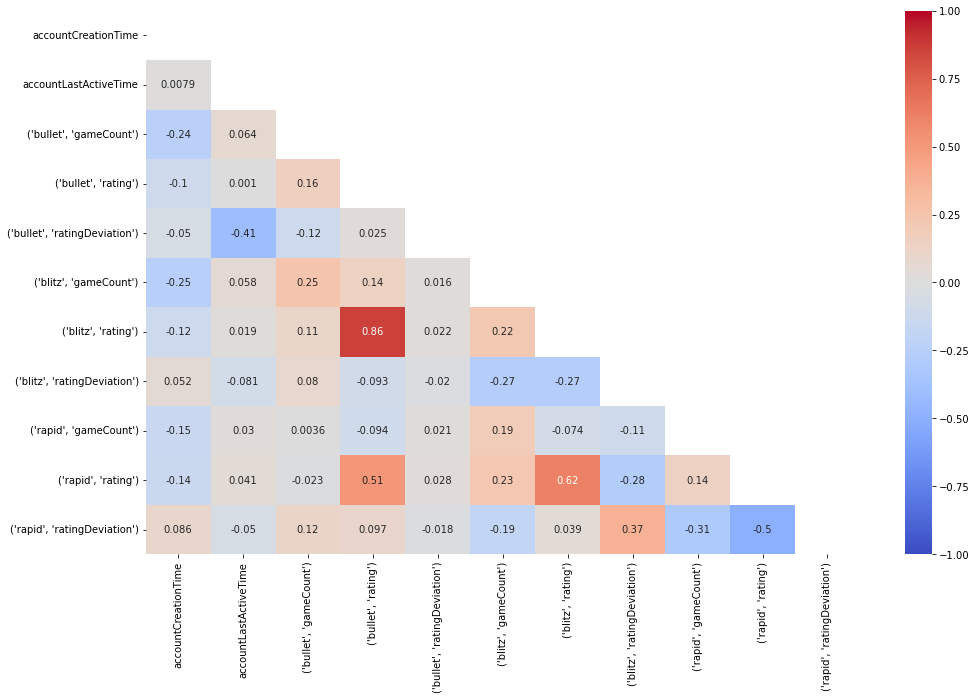

In [14]:
%matplotlib inline
plt.figure(figsize=(16, 10))
#Create a lower triangle matrix
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr_mat_bullet, dtype=bool))
sns.heatmap(corr_mat_bullet,vmin=-1, vmax=1, mask = mask,annot=True, cmap = 'coolwarm')
plt.show()

#### Blitz players

In [15]:
#Change datetime columns to numeric to allow correlations
active_users_df_mod_blitz['accountCreationTime'] = pd.to_numeric(active_users_df_mod_blitz['accountCreationTime'])
active_users_df_mod_blitz['accountLastActiveTime'] = pd.to_numeric(active_users_df_mod_blitz['accountLastActiveTime'])
corr_mat_blitz = active_users_df_mod_blitz.corr()
##Change back to datetime columns
active_users_df_mod_blitz['accountCreationTime'] = pd.to_datetime(active_users_df_mod_blitz['accountCreationTime'])
active_users_df_mod_blitz['accountLastActiveTime'] = pd.to_datetime(active_users_df_mod_blitz['accountLastActiveTime'])
display(corr_mat_blitz)

,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)"
accountCreationTime,1.000000,0.043959,-0.156964,-0.073035,0.070681,-0.232294,-0.057669,-0.100989,-0.162298,-0.102197,0.058251
accountLastActiveTime,0.043959,1.000000,0.017800,0.002799,0.004898,0.070300,0.010589,-0.360375,0.010954,0.008108,-0.002993
"(bullet, gameCount)",-0.156964,0.017800,1.000000,0.335613,-0.374204,0.233179,0.205960,0.127849,0.044071,0.228517,-0.127852
"(bullet, rating)",-0.073035,0.002799,0.335613,1.000000,-0.294929,0.077061,0.807356,0.036620,-0.115808,0.575667,0.003976
"(bullet, ratingDeviation)",0.070681,0.004898,-0.374204,-0.294929,1.000000,0.063773,-0.081550,-0.098765,-0.032426,-0.197818,0.277643
"(blitz, gameCount)",-0.232294,0.070300,0.233179,0.077061,0.063773,1.000000,0.158781,-0.124062,0.066855,0.032604,0.091409
"(blitz, rating)",-0.057669,0.010589,0.205960,0.807356,-0.081550,0.158781,1.000000,-0.010698,-0.133386,0.614115,0.116899
"(blitz, ratingDeviation)",-0.100989,-0.360375,0.127849,0.036620,-0.098765,-0.124062,-0.010698,1.000000,0.010730,-0.003651,-0.001189
"(rapid, gameCount)",-0.162298,0.010954,0.044071,-0.115808,-0.032426,0.066855,-0.133386,0.010730,1.000000,0.119172,-0.330281
"(rapid, rating)",-0.102197,0.008108,0.228517,0.575667,-0.197818,0.032604,0.614115,-0.003651,0.119172,1.000000,-0.480932


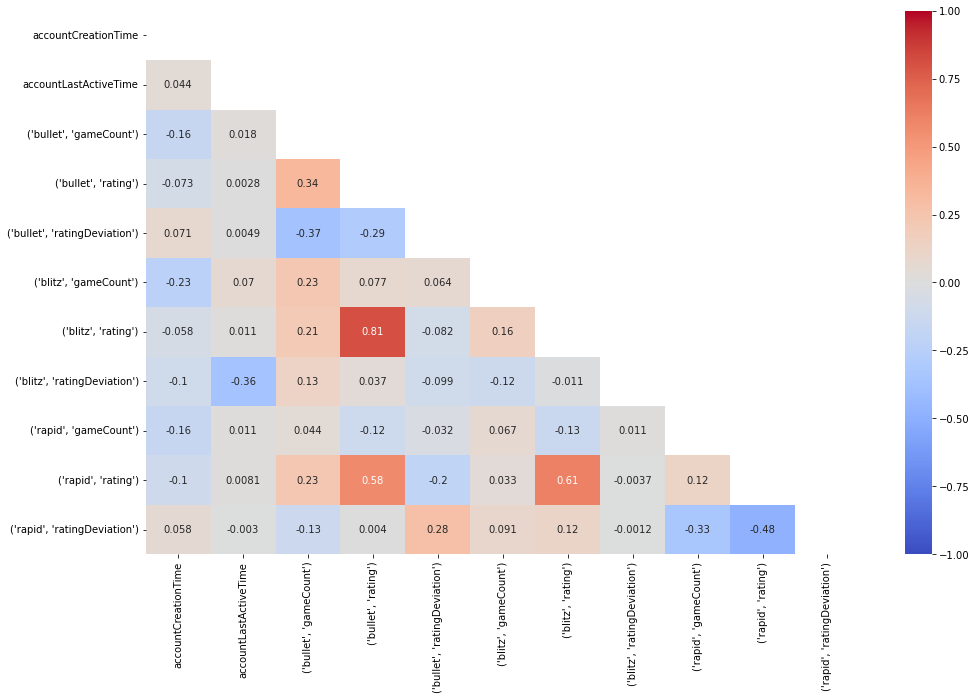

In [16]:
%matplotlib inline
plt.figure(figsize=(16, 10))
#Create a lower triangle matrix
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr_mat_blitz, dtype=bool))
sns.heatmap(corr_mat_blitz,vmin=-1, vmax=1, mask = mask,annot=True, cmap = 'coolwarm')
plt.show()

The correlations seen for all active users are seen here as well for both bullet and blitz players, with the moderate correlations increasing to high correlations. This is explained by the fact that we select players with at least 5.000 games played, so these players are more likely to play all time control formats.

### Cumulative Distribution Functions (CDFs) and Power Distribution Functions (PDFs) for bullet players

#### Datetime features

##### Number of accounts created per month

In [17]:
%matplotlib inline

actGrouped = active_users_df_mod_bullet['accountCreationTime'].groupby(active_users_df_mod_bullet['accountCreationTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=8, pad = 10)
    ax.tick_params(axis='both', which='minor', labelsize=5)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Creation Time (per month)')
    plt.grid(visible = True, linestyle = '-')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountCreationTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,annot=True, fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Creation Time (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

##### Number of accounts that were last active per month

In [18]:
%matplotlib inline
actGrouped = active_users_df_mod_bullet['accountLastActiveTime'].groupby(active_users_df_mod_bullet['accountLastActiveTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.tick_params(axis='both', which='minor', labelsize=10)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Last Active Time (per month)')
    plt.grid(visible = True, linestyle = '--')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountLastActiveTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,
                     annot=True, 
                     fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Last Active Time  (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

#### Numeric features

##### Number of games played

In [19]:
%matplotlib inline
#Transform data for boxplot
gameCount_df =pd.melt(active_users_df_mod_bullet[[('bullet', 'gameCount'),('blitz', 'gameCount'),('rapid', 'gameCount')]])
gameCount_df['variable'] = gameCount_df['variable'].apply(lambda x: x[0])
#PDFs - Unused
# for tc in ['bullet','blitz','rapid']:
#     sns.displot(active_users_df[(tc, 'gameCount')],
#                 kind='kde',
#                 height = 10, aspect = 1.6, cut=0)
#     plt.show()

def plot_as_boxplot(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = sns.boxplot(x="variable", y="value", data=df)
    ax.set(xlabel='Time Control', ylabel='Number of Games Played')
    #Set major and minor ticks on y-axis
    plt.yscale(count_scale)
    if count_scale == 'linear':
        ax.yaxis.set_major_locator(MultipleLocator(10000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
    #Set title and grid
    plt.title('Number of games played ('+count_scale+') per Time control (Boxplot)')
    plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
    plt.tight_layout()
    plt.show()

tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(5)]
tab.set_title(0,"Boxplot (log)")
with sub_tab[0]:
    plot_as_boxplot(gameCount_df,'log')

tab.set_title(1,"Boxplot (linear)")
with sub_tab[1]:
    plot_as_boxplot(gameCount_df,'linear')

#CDFs
for i, tc in enumerate(['bullet','blitz','rapid']):
    tab.set_title(i+2,'CDF ('+tc+')')
    with sub_tab[i+2]:
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_users_df_mod_bullet[(tc, 'gameCount')])
        ax.set(xlabel='Time Control: '+tc)
        #Set x-axis range to tighter value
        plt.xlim(0,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title('Number of '+tc+' games played (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
tab.children = sub_tab
display(tab)

There was little visual information available from the pdfs because the distributions of number of games per time control have very high peaks and very long tails which make the whole plot very large, so they weren't used. A boxplot comparing the three distributions was more interpretable, especially if the values were log scaled.

##### Ratings

In [20]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df_mod_bullet[active_users_df_mod_bullet[(tc, 'gameCount')] > 0][(tc, 'rating')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'frequency',zorder=3)
        ax.set(xlabel='Rating')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(50))
        ax.yaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating (PDF)')
        plt.tight_layout()
        plt.show()
    
    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating')
        #Set x-axis range to tighter value
        plt.xlim(500,plt.xlim()[1])
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
    
tab.children = sub_tab
display(tab)

All 3 time control rating ranges look like they are a normal distribution, which is exactly what is to be expected.

##### Rating deviation

In [21]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df_mod_bullet[active_users_df_mod_bullet[(tc, 'gameCount')] > 0][(tc, 'ratingDeviation')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'percent',zorder=3)
        ax.set(xlabel='Rating Deviation')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.25))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating deviation (PDF)')
        plt.tight_layout()
        plt.show()

    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating Deviation')
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating deviation (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

For all time controls, the distribution looks like it is an exponential or Pareto distribution. This is to be expected as chess player activity should follow the Pareto principle, even among the most active players.

There was a rather high amount of users that had Games Completion Rate = 0 (around 12%), even though they are among the very active users. It could be a placeholder value if it wasn't calculated, or it could actually be true. In either case, removing those players won't cause a problem, as at a certain point of choosing the final dataset we would want users with extremely high or perfect Games Completion Rate (95-100%). 

What was very curious is that there are no users with Games Completion Rate = 98 & 99. On further inspection it turns out that the variable is calculated over the last 30 losses of the player, so completion rates will go 100%, 97%, 93%, ... as 30/30=100%. 29/30=96.67% approx 97%. 28/30=93.33% approx 93%. This explains the high peaks with a constant difference between them. The very small values between the peaks probably mean that there is an increase of 1-2 % based on another metric.

It should also be said that as uncompleted games counts disconnects, failure to start, aborts, and letting time run out instead of resigning, so if we were to filter based on this feature, we could be somewhat lenient (we shouldn't exclude players just because they have a bad internet connection).

### Pairwise relationships

Plotting the relationships between all of the features would be unnecessarily complicated and disorganised.
The relationships that would be of interest should be explored.
Initially these would be between:
- 'gameCount' and 'rating' (same time control)
- 'gameCount' and 'accountCreationTime'
- 'gameCount' and 'gamesCompletionRate'
- 'rating' and 'accountCreationTime'
- 'rating' and 'gamesCompletionRate'
- 'gameCount' and 'gameCount' (different time controls)
- 'rating' and 'rating' (different time controls)

In [22]:
active_users_df.columns

# sns.pairplot(data = active_users_df[['accountCreationTime',
#              'accountLastActiveTime',       ('bullet', 'gameCount'),
#                 ('bullet', 'rating'), ('bullet', 'ratingDeviation'),
#               ('blitz', 'gameCount'),           ('blitz', 'rating'),
#         ('blitz', 'ratingDeviation'),        ('rapid', 'gameCount'),
#                  ('rapid', 'rating'),  ('rapid', 'ratingDeviation'),
#                'gamesCompletionRate']])

Index([                   'username',         'accountCreationTime',
             'accountLastActiveTime',       ('bullet', 'gameCount'),
                ('bullet', 'rating'), ('bullet', 'ratingDeviation'),
              ('blitz', 'gameCount'),           ('blitz', 'rating'),
        ('blitz', 'ratingDeviation'),        ('rapid', 'gameCount'),
                 ('rapid', 'rating'),  ('rapid', 'ratingDeviation'),
               'gamesCompletionRate',                       'title',
                          'verified'],
      dtype='object')

#### Rating & Number of Games Played (same time control)

In [23]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_bullet[active_users_df_mod_bullet[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        fig = plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df[[(tc, 'rating'),(tc, 'gameCount')]],
                        x = (tc, 'rating'), y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating')
        ax.set(ylabel='Number of games')
        plt.title('Rating & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Number of Games Played (given time control)

In [24]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_bullet[active_users_df_mod_bullet[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Number of games')
        plt.title('Account Creation Time & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Rating (given time control)

In [25]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_bullet[active_users_df_mod_bullet[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Rating')
        plt.title('Account Creation Time & Rating ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', bottom=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Number of Games Played (different time controls)

In [26]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df_mod_bullet,
                        x = (tc_1, 'gameCount'), y = (tc_2, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Number of games ('+tc_1+')')
        ax.set(ylabel='Number of games ('+tc_2+')')
        plt.title('Number of games ('+tc_1+') & Number of games ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(0,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Rating (different time controls)

In [27]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df_mod_bullet,
                        x = (tc_1, 'rating'), y = (tc_2, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating ('+tc_1+')')
        ax.set(ylabel='Rating ('+tc_2+')')
        plt.title('Rating ('+tc_1+') & Rating ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

### 3D visualization

#### Number of games played (all time controls) (log scaled)

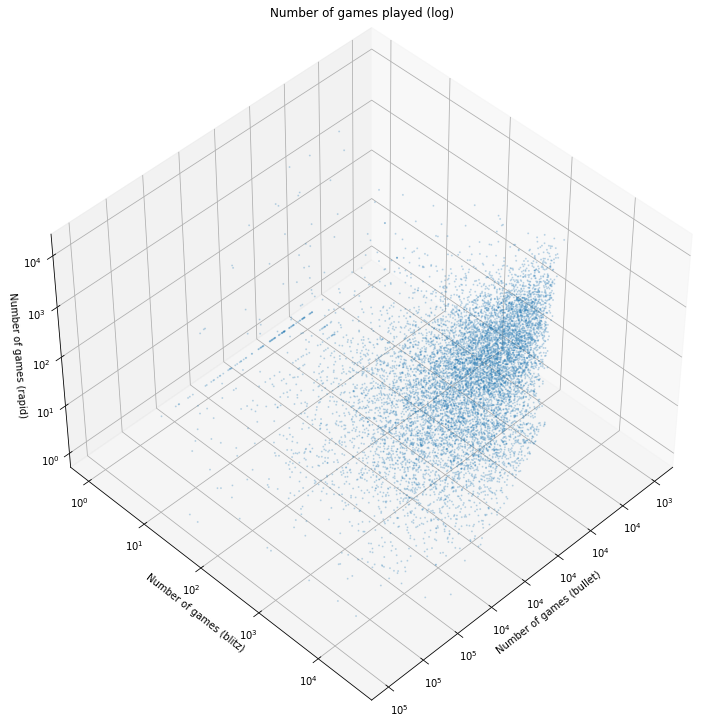

In [28]:
%matplotlib inline
def log_tick_formatter(val, pos=None):
    return r"$10^{:.0f}$".format(val)

tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
tc_x_log = np.log10(active_users_df_mod_bullet[(tc_x, 'gameCount')].replace(0,1))
tc_y_log = np.log10(active_users_df_mod_bullet[(tc_y, 'gameCount')].replace(0,1))
tc_z_log = np.log10(active_users_df_mod_bullet[(tc_z, 'gameCount')].replace(0,1))
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Number of games ('+tc_x+')')
ax.set(ylabel='Number of games ('+tc_y+')')
ax.set(zlabel='Number of games ('+tc_z+')')
plt.title('Number of games played (log)')
#Plot 3D
ax.scatter(tc_x_log, tc_y_log, tc_z_log, s=1, alpha=0.2)
#Set major and minor ticks
ax.yaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='z', which='both', bottom=True)
#Set view
ax.view_init(45, 45)
plt.tight_layout()
plt.show()

#### Ratings (all time controls)

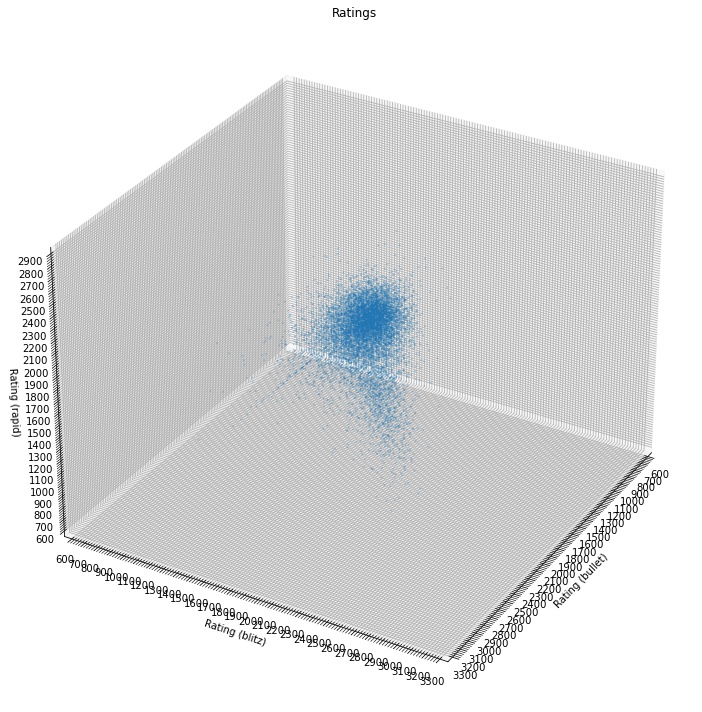

In [29]:
%matplotlib inline
tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Rating ('+tc_x+')')
ax.set(ylabel='Rating ('+tc_y+')')
ax.set(zlabel='Rating ('+tc_z+')')
plt.title('Ratings')
#Plot 3D
ax.scatter(active_users_df_mod_bullet[(tc_x, 'rating')], 
           active_users_df_mod_bullet[(tc_y, 'rating')],
           active_users_df_mod_bullet[(tc_z, 'rating')],s=1,alpha=0.2)
#Set axis range to tighter values
plt.ylim(600,roundup_100(active_users_df_mod_bullet[(tc_x, 'rating')].max()))
plt.xlim(600,roundup_100(active_users_df_mod_bullet[(tc_y, 'rating')].max()))
ax.set_zlim(600,roundup_100(active_users_df_mod_bullet[(tc_z, 'rating')].max()))
#Set major and minor ticks
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_locator(MultipleLocator(100))
ax.zaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='z', which='both', bottom=True)
#Set grid
# plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'z', linestyle = '--',zorder=0)
#Set view
ax.view_init(30, 30)
plt.tight_layout()
plt.show()

### Cumulative Distribution Functions (CDFs) and Power Distribution Functions (PDFs) for blitz players

#### Datetime features

##### Number of accounts created per month

In [30]:
%matplotlib inline

actGrouped = active_users_df_mod_blitz['accountCreationTime'].groupby(active_users_df_mod_blitz['accountCreationTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=8, pad = 10)
    ax.tick_params(axis='both', which='minor', labelsize=5)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Creation Time (per month)')
    plt.grid(visible = True, linestyle = '-')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountCreationTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,annot=True, fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Creation Time (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

##### Number of accounts that were last active per month

In [31]:
%matplotlib inline
actGrouped = active_users_df_mod_blitz['accountLastActiveTime'].groupby(active_users_df_mod_blitz['accountLastActiveTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.tick_params(axis='both', which='minor', labelsize=10)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Last Active Time (per month)')
    plt.grid(visible = True, linestyle = '--')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountLastActiveTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,
                     annot=True, 
                     fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Last Active Time  (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

#### Numeric features

##### Number of games played

In [32]:
%matplotlib inline
#Transform data for boxplot
gameCount_df =pd.melt(active_users_df_mod_blitz[[('bullet', 'gameCount'),('blitz', 'gameCount'),('rapid', 'gameCount')]])
gameCount_df['variable'] = gameCount_df['variable'].apply(lambda x: x[0])
#PDFs - Unused
# for tc in ['bullet','blitz','rapid']:
#     sns.displot(active_users_df[(tc, 'gameCount')],
#                 kind='kde',
#                 height = 10, aspect = 1.6, cut=0)
#     plt.show()

def plot_as_boxplot(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = sns.boxplot(x="variable", y="value", data=df)
    ax.set(xlabel='Time Control', ylabel='Number of Games Played')
    #Set major and minor ticks on y-axis
    plt.yscale(count_scale)
    if count_scale == 'linear':
        ax.yaxis.set_major_locator(MultipleLocator(10000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
    #Set title and grid
    plt.title('Number of games played ('+count_scale+') per Time control (Boxplot)')
    plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
    plt.tight_layout()
    plt.show()

tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(5)]
tab.set_title(0,"Boxplot (log)")
with sub_tab[0]:
    plot_as_boxplot(gameCount_df,'log')

tab.set_title(1,"Boxplot (linear)")
with sub_tab[1]:
    plot_as_boxplot(gameCount_df,'linear')

#CDFs
for i, tc in enumerate(['bullet','blitz','rapid']):
    tab.set_title(i+2,'CDF ('+tc+')')
    with sub_tab[i+2]:
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_users_df_mod_blitz[(tc, 'gameCount')])
        ax.set(xlabel='Time Control: '+tc)
        #Set x-axis range to tighter value
        plt.xlim(0,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title('Number of '+tc+' games played (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
tab.children = sub_tab
display(tab)

There was little visual information available from the pdfs because the distributions of number of games per time control have very high peaks and very long tails which make the whole plot very large, so they weren't used. A boxplot comparing the three distributions was more interpretable, especially if the values were log scaled.

##### Ratings

In [33]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df_mod_blitz[active_users_df_mod_blitz[(tc, 'gameCount')] > 0][(tc, 'rating')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'frequency',zorder=3)
        ax.set(xlabel='Rating')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(50))
        ax.yaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating (PDF)')
        plt.tight_layout()
        plt.show()
    
    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating')
        #Set x-axis range to tighter value
        plt.xlim(500,plt.xlim()[1])
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
    
tab.children = sub_tab
display(tab)

All 3 time control rating ranges look like they are a normal distribution, which is exactly what is to be expected.

##### Rating deviation

In [34]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df_mod_blitz[active_users_df_mod_blitz[(tc, 'gameCount')] > 0][(tc, 'ratingDeviation')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'percent',zorder=3)
        ax.set(xlabel='Rating Deviation')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.25))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating deviation (PDF)')
        plt.tight_layout()
        plt.show()

    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating Deviation')
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating deviation (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

For all time controls, the distribution looks like it is an exponential or Pareto distribution. This is to be expected as chess player activity should follow the Pareto principle, even among the most active players.

There was a rather high amount of users that had Games Completion Rate = 0 (around 12%), even though they are among the very active users. It could be a placeholder value if it wasn't calculated, or it could actually be true. In either case, removing those players won't cause a problem, as at a certain point of choosing the final dataset we would want users with extremely high or perfect Games Completion Rate (95-100%). 

What was very curious is that there are no users with Games Completion Rate = 98 & 99. On further inspection it turns out that the variable is calculated over the last 30 losses of the player, so completion rates will go 100%, 97%, 93%, ... as 30/30=100%. 29/30=96.67% approx 97%. 28/30=93.33% approx 93%. This explains the high peaks with a constant difference between them. The very small values between the peaks probably mean that there is an increase of 1-2 % based on another metric.

It should also be said that as uncompleted games counts disconnects, failure to start, aborts, and letting time run out instead of resigning, so if we were to filter based on this feature, we could be somewhat lenient (we shouldn't exclude players just because they have a bad internet connection).

### Pairwise relationships

Plotting the relationships between all of the features would be unnecessarily complicated and disorganised.
The relationships that would be of interest should be explored.
Initially these would be between:
- 'gameCount' and 'rating' (same time control)
- 'gameCount' and 'accountCreationTime'
- 'gameCount' and 'gamesCompletionRate'
- 'rating' and 'accountCreationTime'
- 'rating' and 'gamesCompletionRate'
- 'gameCount' and 'gameCount' (different time controls)
- 'rating' and 'rating' (different time controls)

In [35]:
active_users_df.columns

# sns.pairplot(data = active_users_df[['accountCreationTime',
#              'accountLastActiveTime',       ('bullet', 'gameCount'),
#                 ('bullet', 'rating'), ('bullet', 'ratingDeviation'),
#               ('blitz', 'gameCount'),           ('blitz', 'rating'),
#         ('blitz', 'ratingDeviation'),        ('rapid', 'gameCount'),
#                  ('rapid', 'rating'),  ('rapid', 'ratingDeviation'),
#                'gamesCompletionRate']])

Index([                   'username',         'accountCreationTime',
             'accountLastActiveTime',       ('bullet', 'gameCount'),
                ('bullet', 'rating'), ('bullet', 'ratingDeviation'),
              ('blitz', 'gameCount'),           ('blitz', 'rating'),
        ('blitz', 'ratingDeviation'),        ('rapid', 'gameCount'),
                 ('rapid', 'rating'),  ('rapid', 'ratingDeviation'),
               'gamesCompletionRate',                       'title',
                          'verified'],
      dtype='object')

#### Rating & Number of Games Played (same time control)

In [36]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_blitz[active_users_df_mod_blitz[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        fig = plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df[[(tc, 'rating'),(tc, 'gameCount')]],
                        x = (tc, 'rating'), y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating')
        ax.set(ylabel='Number of games')
        plt.title('Rating & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Number of Games Played (given time control)

In [37]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_blitz[active_users_df_mod_blitz[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Number of games')
        plt.title('Account Creation Time & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Rating (given time control)

In [38]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df_mod_blitz[active_users_df_mod_blitz[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Rating')
        plt.title('Account Creation Time & Rating ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', bottom=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Number of Games Played (different time controls)

In [39]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df_mod_blitz,
                        x = (tc_1, 'gameCount'), y = (tc_2, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Number of games ('+tc_1+')')
        ax.set(ylabel='Number of games ('+tc_2+')')
        plt.title('Number of games ('+tc_1+') & Number of games ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(0,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Rating (different time controls)

In [40]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df_mod_blitz,
                        x = (tc_1, 'rating'), y = (tc_2, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating ('+tc_1+')')
        ax.set(ylabel='Rating ('+tc_2+')')
        plt.title('Rating ('+tc_1+') & Rating ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

### 3D visualization

#### Number of games played (all time controls) (log scaled)

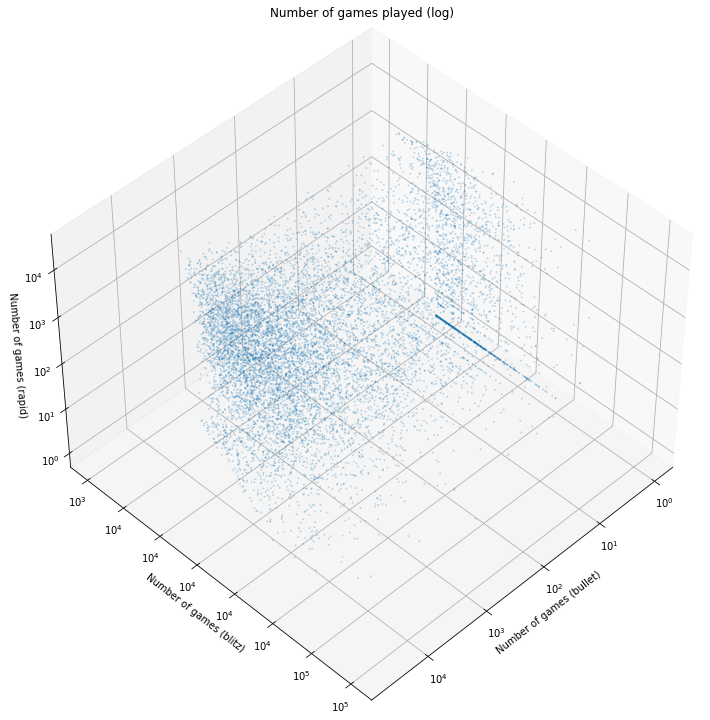

In [41]:
%matplotlib inline
def log_tick_formatter(val, pos=None):
    return r"$10^{:.0f}$".format(val)

tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
tc_x_log = np.log10(active_users_df_mod_blitz[(tc_x, 'gameCount')].replace(0,1))
tc_y_log = np.log10(active_users_df_mod_blitz[(tc_y, 'gameCount')].replace(0,1))
tc_z_log = np.log10(active_users_df_mod_blitz[(tc_z, 'gameCount')].replace(0,1))
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Number of games ('+tc_x+')')
ax.set(ylabel='Number of games ('+tc_y+')')
ax.set(zlabel='Number of games ('+tc_z+')')
plt.title('Number of games played (log)')
#Plot 3D
ax.scatter(tc_x_log, tc_y_log, tc_z_log, s=1, alpha=0.2)
#Set major and minor ticks
ax.yaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='z', which='both', bottom=True)
#Set view
ax.view_init(45, 45)
plt.tight_layout()
plt.show()

#### Ratings (all time controls)

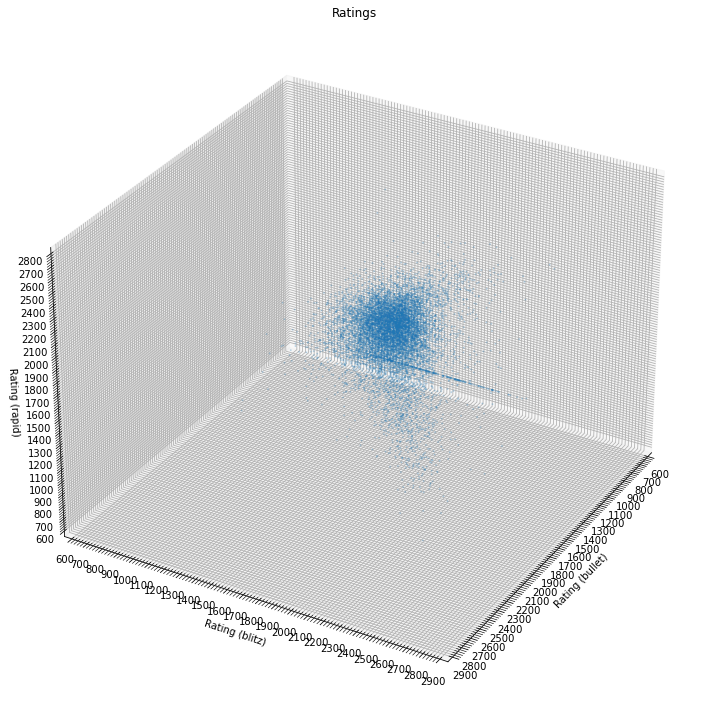

In [42]:
%matplotlib inline
tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Rating ('+tc_x+')')
ax.set(ylabel='Rating ('+tc_y+')')
ax.set(zlabel='Rating ('+tc_z+')')
plt.title('Ratings')
#Plot 3D
ax.scatter(active_users_df_mod_blitz[(tc_x, 'rating')], 
           active_users_df_mod_blitz[(tc_y, 'rating')],
           active_users_df_mod_blitz[(tc_z, 'rating')],s=1,alpha=0.2)
#Set axis range to tighter values
plt.ylim(600,roundup_100(active_users_df_mod_blitz[(tc_x, 'rating')].max()))
plt.xlim(600,roundup_100(active_users_df_mod_blitz[(tc_y, 'rating')].max()))
ax.set_zlim(600,roundup_100(active_users_df_mod_blitz[(tc_z, 'rating')].max()))
#Set major and minor ticks
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_locator(MultipleLocator(100))
ax.zaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='z', which='both', bottom=True)
#Set grid
# plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'z', linestyle = '--',zorder=0)
#Set view
ax.view_init(30, 30)
plt.tight_layout()
plt.show()

## Save the modified datasets (final user list)

In [43]:
#Save blitz and bullet players in separate files
#If the file exist, save over it
active_users_df_mod_blitz.to_csv(temp_data_folder + '\\very_active_users_final_blitz.csv')
active_users_df_mod_bullet.to_csv(temp_data_folder + '\\very_active_users_final_bullet.csv')
#Check if save was successful
if os.path.exists(temp_data_folder + '\\very_active_users_final_blitz.csv'):
    print('Final blitz dataset is saved successfully')
if os.path.exists(temp_data_folder + '\\very_active_users_final_bullet.csv'):
    print('Final bullet dataset is saved successfully')

Final blitz dataset is saved successfully
Final bullet dataset is saved successfully
